# What drives the price of a car?

![](images/kurt.jpeg)

**OVERVIEW**

In this application, you will explore a dataset from kaggle. The original dataset contained information on 3 million used cars. The provided dataset contains information on 426K cars to ensure speed of processing.  Your goal is to understand what factors make a car more or less expensive.  As a result of your analysis, you should provide clear recommendations to your client -- a used car dealership -- as to what consumers value in a used car.

### CRISP-DM Framework

<center>
    <img src = images/crisp.png width = 50%/>
</center>


To frame the task, throughout our practical applications we will refer back to a standard process in industry for data projects called CRISP-DM.  This process provides a framework for working through a data problem.  Your first step in this application will be to read through a brief overview of CRISP-DM [here](https://mo-pcco.s3.us-east-1.amazonaws.com/BH-PCMLAI/module_11/readings_starter.zip).  After reading the overview, answer the questions below.

### Business Understanding

From a business perspective, we are tasked with identifying key drivers for used car prices.  In the CRISP-DM overview, we are asked to convert this business framing to a data problem definition.  Using a few sentences, reframe the task as a data task with the appropriate technical vocabulary. 

### Data Understanding

After considering the business understanding, we want to get familiar with our data.  Write down some steps that you would take to get to know the dataset and identify any quality issues within.  Take time to get to know the dataset and explore what information it contains and how this could be used to inform your business understanding.

In [123]:
import warnings
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
from sklearn.linear_model import LinearRegression
from sklearn import linear_model
from sklearn.compose import ColumnTransformer, make_column_transformer, make_column_selector
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_absolute_error,r2_score,mean_squared_error
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV
from sklearn.pipeline import make_pipeline
warnings.filterwarnings('ignore')

In [124]:
df = pd.read_csv('data/vehicles.csv')

In [125]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 426880 entries, 0 to 426879
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype  
---  ------        --------------   -----  
 0   id            426880 non-null  int64  
 1   region        426880 non-null  object 
 2   price         426880 non-null  int64  
 3   year          425675 non-null  float64
 4   manufacturer  409234 non-null  object 
 5   model         421603 non-null  object 
 6   condition     252776 non-null  object 
 7   cylinders     249202 non-null  object 
 8   fuel          423867 non-null  object 
 9   odometer      422480 non-null  float64
 10  title_status  418638 non-null  object 
 11  transmission  424324 non-null  object 
 12  VIN           265838 non-null  object 
 13  drive         296313 non-null  object 
 14  size          120519 non-null  object 
 15  type          334022 non-null  object 
 16  paint_color   296677 non-null  object 
 17  state         426880 non-null  object 
dtypes: f

In [126]:
df.head()

,id,region,price,year,manufacturer,model,condition,cylinders,fuel,odometer,title_status,transmission,VIN,drive,size,type,paint_color,state
0,7222695916,prescott,6000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,az
1,7218891961,fayetteville,11900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ar
2,7221797935,florida keys,21000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,fl
3,7222270760,worcester / central MA,1500,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,ma
4,7210384030,greensboro,4900,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,nc


#### Understanding target column (price)

array([[<Axes: title={'center': 'id'}>,
        <Axes: title={'center': 'price'}>],
       [<Axes: title={'center': 'year'}>,
        <Axes: title={'center': 'odometer'}>]], dtype=object)

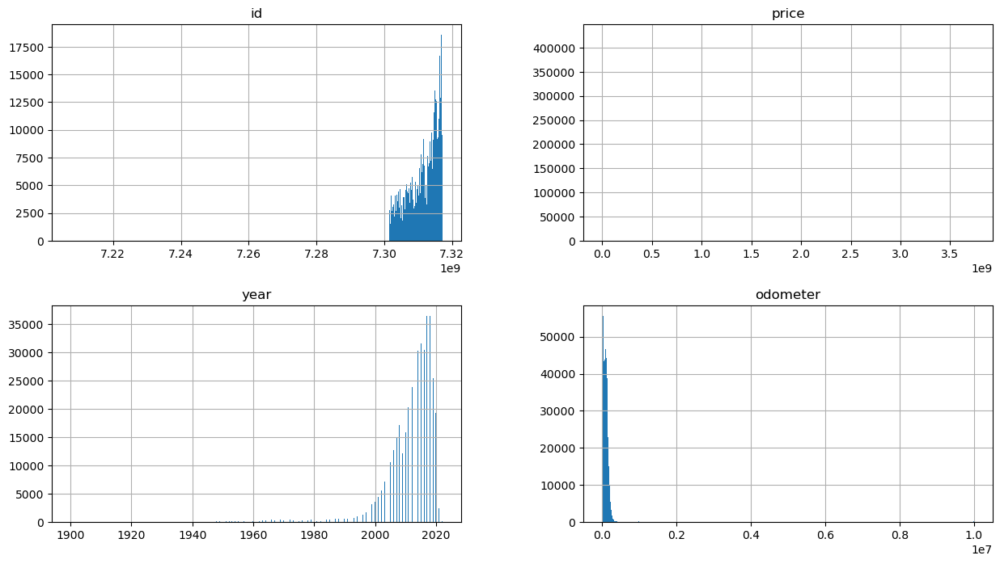

In [127]:
df.hist(bins=500, figsize = (15,8))

array([[<Axes: title={'center': 'price'}>]], dtype=object)

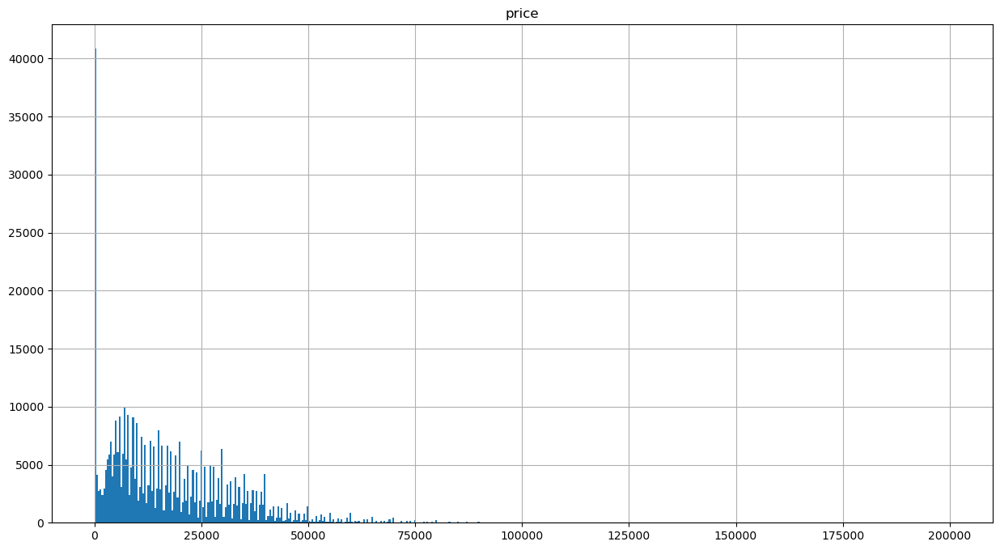

In [128]:
df[df['price'] < 200000].hist(column = 'price',bins=500, figsize = (15,8))

In [129]:
# rows having zero price values. This is bad data
print (df[df['price'] == 0]['price'].count())
df_positive_price = df[df['price'] > 0]
df_positive_price['price'].count()

32895


393985

In [130]:
pd.set_option('display.float_format', lambda x: '%.2f' % x)
df_positive_price[['price']].describe()

,price
count,393985.00
mean,81477.63
std,12680636.89
min,1.00
25%,7000.00
50%,15000.00
75%,27590.00
max,3736928711.00


In [131]:
p = [0.01, 0.05, 0.1, 0.85, 0.95, 0.99, 0.9999]
df_positive_price[['price']].describe(p)

,price
count,393985.00
mean,81477.63
std,12680636.89
min,1.00
1%,150.00
5%,1988.00
10%,3650.00
50%,15000.00
85%,33995.00
95%,44999.00


In [132]:
# We need to define boundaries for outliers

price_low = df_positive_price['price'].quantile(0.01)
price_high = df_positive_price['price'].quantile(0.9999)
print('Num rows below lower boundary = ', df_positive_price[df_positive_price['price'] < price_low]['price'].count())
print('Num rows above higher boundary = ', df_positive_price[df_positive_price['price'] > price_high]['price'].count())


Num rows below lower boundary =  3924
Num rows above higher boundary =  35


#### Understanding null values

In [169]:
def print_df_info(df):
    print('total rows={}'.format(len(df)))
    rows = []
    for col in df:
        num_unique = df[col].unique().size
        unique_values = df[col].unique() if num_unique < 20 else np.random.choice(df[col].unique(), 10)
        rows.append([col, df[col].dtypes, df[col].isnull().sum(), df[col].unique().size, unique_values])
    
    print(pd.DataFrame(rows, columns=['column','dtype','num_null','num_unique','unique_values']))
    
    missing_pct = df.isna().mean().round(4)*100 # percentage of missing values 
    missing_pct = missing_pct[missing_pct > 0]
    if len(missing_pct) > 0:
        plt.figure(figsize=(8, 6))
        missing_pct.sort_values().plot(kind='barh')
        plt.title('Percentage of Missing Values by Column')
        plt.xlabel('Percentage')
        plt.ylabel('Column')
        plt.show()

print_df_info(df)

total rows=358290
          column    dtype  num_null  num_unique  \
0         region   object         0         404   
1          price    int64         0       14541   
2           year  float64         0         107   
3   manufacturer   object         0          41   
4          model   object         0       20680   
5      condition   object         0           6   
6      cylinders  float64         0           7   
7           fuel   object         0           5   
8       odometer  float64         0       93482   
9   title_status   object         0           6   
10  transmission   object         0           3   
11         drive   object         0           3   
12          size   object         0           4   
13          type   object         0          13   
14         state   object         0          51   

                                        unique_values  
0   [prescott, southwest MN, northwest KS, college...  
1   [32570, 22384, 47994, 468, 16612, 57954, 13798...

In [134]:
pd.set_option('display.float_format', lambda x: '%.2f' % x)
df.describe()

,id,price,year,odometer
count,426880.00,426880.00,425675.00,422480.00
mean,7311486634.22,75199.03,2011.24,98043.33
std,4473170.41,12182282.17,9.45,213881.50
min,7207408119.00,0.00,1900.00,0.00
25%,7308143339.25,5900.00,2008.00,37704.00
50%,7312620821.00,13950.00,2013.00,85548.00
75%,7315253543.50,26485.75,2017.00,133542.50
max,7317101084.00,3736928711.00,2022.00,10000000.00


#### Understanding relation between model and other columns having high null values

In [135]:
def correlation_with_make_model(col):
    print('-------------------------------------')
    print('Exploring the column "{}" with total number of null values = {}'.format(col, df[col].isnull().sum()))
    # df_short
    if col == 'manufacturer':
        df_short = df[['id','model',col]].dropna(subset=['model',col]).reset_index(drop=True)
        df_short['make_model'] = df_short['model'].astype(str)
    else:
        df_short = df[['id','manufacturer','model',col]].dropna(subset=['manufacturer','model',col]).reset_index(drop=True)
        df_short['make_model'] = df_short['manufacturer'].astype(str) + df_short['model'].astype(str)
    print(df_short.info())
    df_null = df[pd.isnull(df[col])]
    df_null_model_unique = df_null['model'].nunique()
    df_short_model_unique = df_short['model'].nunique()
    df_null_short_model_diff = len(set(df_null['model'].unique()).difference(set(df_short['model'].unique())))
    df_null_short_model_common_names = set(df_null['model'].unique()).intersection(set(df_short['model'].unique()))
    df_null_short_model_common = len(df_null_short_model_common_names)
    values_can_be_predicted = len(df_null[df_null['model'].isin(df_null_short_model_common_names)])
    print('df_null unique model = {}, df_short unique model = {}, df_null - df_short unique values = {}, df_null & df_short unique model intersection = {}, num values that can be predicted = {}'.format(df_null_model_unique, df_short_model_unique, df_null_short_model_diff, df_null_short_model_common, values_can_be_predicted))

    # df_model
    df_model = df_short.filter(['make_model'], axis=1).drop_duplicates()
    unique_col = 'unique_{}_per_model'.format(col)
    df_model[unique_col] = df_short.groupby(by=['make_model'])[col].transform('nunique')
    df_model.reset_index(drop=True)
    df_model.plot.hist(bins=50)
    print(df_model.sort_values([unique_col], ascending=False))
    
    print('total make_model = {}'.format(df_model.size))
    df_model.loc[df_model[unique_col]>1]
    df_temp = pd.merge(df_short,df_model.loc[df_model[unique_col]>1],on='make_model').groupby(['make_model',col])['id'].count().reset_index(name="count").sort_values(['make_model','count'], ascending=False)
    df_temp = df_temp.groupby('make_model').agg({'count': lambda x: list(x)})
    df_temp['mean'] = df_temp['count'].apply(np.mean)
    print('make_model with > 1 unique "{}"s = {}'.format(col,df_temp.size))
    print('make_model with mean of count per unique "{}" < 2 = {}'.format(col, df_temp[df_temp['mean']<2].size))
    print(df_temp[df_temp['mean']<2])
# df_temp[df_temp['mean']<50].plot.hist(bins=1000)

-------------------------------------
Exploring the column "drive" with total number of null values = 130567
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 283106 entries, 0 to 283105
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   id            283106 non-null  int64 
 1   manufacturer  283106 non-null  object
 2   model         283106 non-null  object
 3   drive         283106 non-null  object
 4   make_model    283106 non-null  object
dtypes: int64(1), object(4)
memory usage: 10.8+ MB
None
df_null unique model = 12288, df_short unique model = 19410, df_null - df_short unique values = 6984, df_null & df_short unique model intersection = 5305, num values that can be predicted = 101934
                            make_model  unique_drive_per_model
0                        fordf-150 xlt                       3
1468                    hondaaccord ex                       3
5967                toyotaprius hybrid

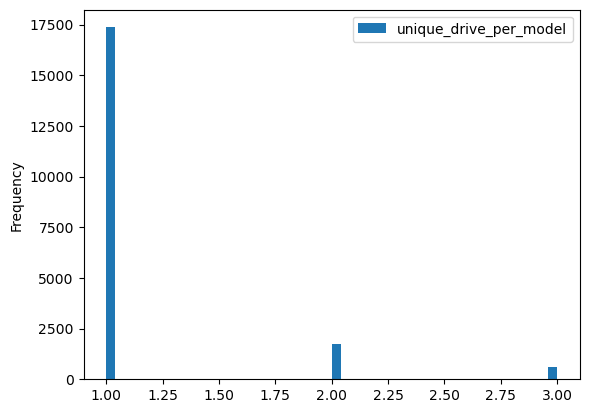

In [136]:
correlation_with_make_model('drive')

-------------------------------------
Exploring the column "size" with total number of null values = 306361
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 113476 entries, 0 to 113475
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   id            113476 non-null  int64 
 1   manufacturer  113476 non-null  object
 2   model         113476 non-null  object
 3   size          113476 non-null  object
 4   make_model    113476 non-null  object
dtypes: int64(1), object(4)
memory usage: 4.3+ MB
None
df_null unique model = 22203, df_short unique model = 10559, df_null - df_short unique values = 16890, df_null & df_short unique model intersection = 5314, num values that can be predicted = 212521
                          make_model  unique_size_per_model
7823             hondainsight hybrid                      4
768                      chrysler200                      4
831                      lexusrx 300            

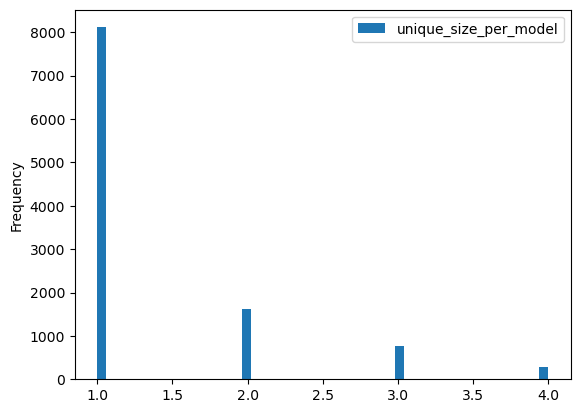

In [137]:
correlation_with_make_model('size')

-------------------------------------
Exploring the column "type" with total number of null values = 92858
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 319954 entries, 0 to 319953
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   id            319954 non-null  int64 
 1   manufacturer  319954 non-null  object
 2   model         319954 non-null  object
 3   type          319954 non-null  object
 4   make_model    319954 non-null  object
dtypes: int64(1), object(4)
memory usage: 12.2+ MB
None
df_null unique model = 10350, df_short unique model = 20673, df_null - df_short unique values = 5570, df_null & df_short unique model intersection = 4781, num values that can be predicted = 77926
                             make_model  unique_type_per_model
150                         fordmustang                     10
725                  dodgegrand caravan                      9
477                  chryslerpt cruiser  

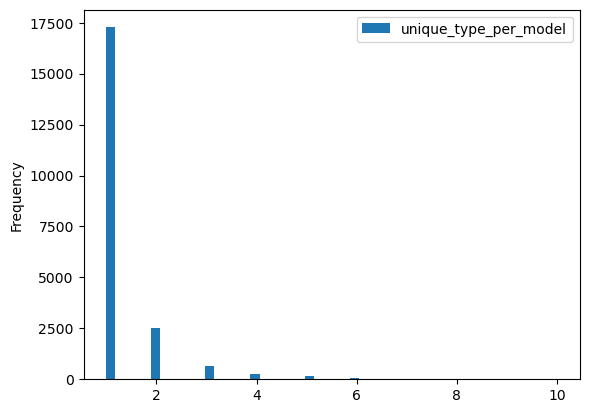

In [138]:
correlation_with_make_model('type')

-------------------------------------
Exploring the column "cylinders" with total number of null values = 177678
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 237075 entries, 0 to 237074
Data columns (total 5 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   id            237075 non-null  int64 
 1   manufacturer  237075 non-null  object
 2   model         237075 non-null  object
 3   cylinders     237075 non-null  object
 4   make_model    237075 non-null  object
dtypes: int64(1), object(4)
memory usage: 9.0+ MB
None
df_null unique model = 13075, df_short unique model = 18176, df_null - df_short unique values = 7880, df_null & df_short unique model intersection = 5196, num values that can be predicted = 134326
                    make_model  unique_cylinders_per_model
118            chevroletmalibu                           7
219               nissanaltima                           7
6126          volkswagenbeetle                 

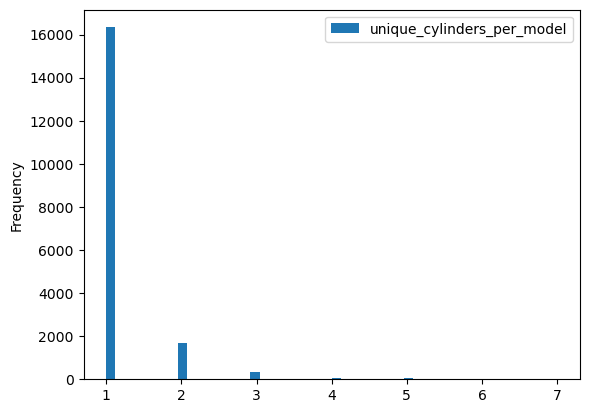

In [139]:
correlation_with_make_model('cylinders')

-------------------------------------
Exploring the column "manufacturer" with total number of null values = 17646
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 404026 entries, 0 to 404025
Data columns (total 4 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   id            404026 non-null  int64 
 1   model         404026 non-null  object
 2   manufacturer  404026 non-null  object
 3   make_model    404026 non-null  object
dtypes: int64(1), object(3)
memory usage: 12.3+ MB
None
df_null unique model = 6044, df_short unique model = 23747, df_null - df_short unique values = 5903, df_null & df_short unique model intersection = 142, num values that can be predicted = 799
                    make_model  unique_manufacturer_per_model
2194                     truck                             11
4636                       van                             10
2226                    pickup                              9
975                  

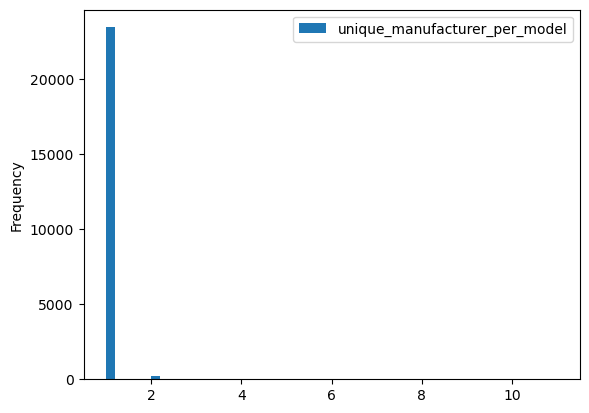

In [140]:
correlation_with_make_model('manufacturer')

In [141]:
# for col in df_short:
#     if df_short[col].dtypes == object:
#         df_short[col] = pd.factorize(df_short[col])[0]

# print_df_info(df_short)

In [142]:
# sns.heatmap(df_short.select_dtypes(include=np.number).corr(), fmt=".2f", cmap='coolwarm', square=True, linewidths=.1, cbar_kws={"shrink": .5})

#### Relation between price and paint_color, condition

In [145]:
px.box(df[df['price']<500000].dropna(subset=['paint_color']), y="price", color="paint_color")

In [146]:
px.box(df[df['price']<500000].dropna(subset=['condition']), y="price", color="condition")

#### Condition proportion

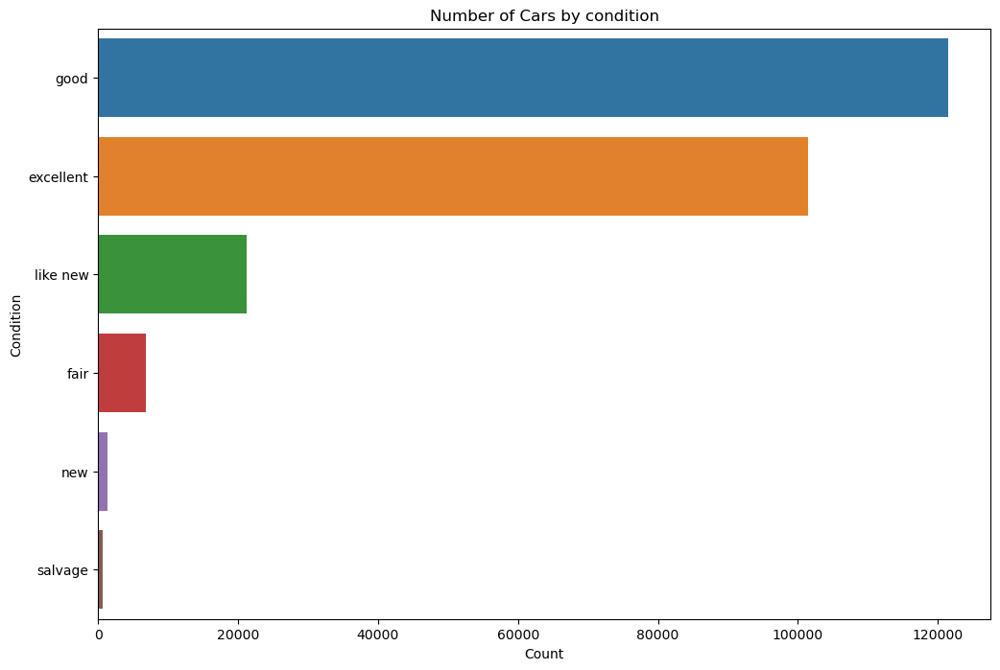

condition
good        0.48
excellent   0.40
like new    0.08
fair        0.03
new         0.01
salvage     0.00
Name: proportion, dtype: float64

In [147]:
plt.figure(figsize=(12, 8))
sns.countplot(y='condition', data=df, order=df['condition'].value_counts().index)
plt.title('Number of Cars by condition')
plt.xlabel('Count')
plt.ylabel('Condition')
plt.show()

df['condition'].value_counts(normalize=True)

#### Conclusion
* Price column has outlier values and such rows can be deleted
* Following columns do not seem important as a feature and can be dropped
  * id
  * VIN
  * paint_color
* Correlation of multiple columns with model:
  * following columns have a lot of null: manufacturer, cylinders, drive, size, type
  * The above columns seem to have strong correlation with model which leaves us with the following two approaches
    * Drop the column and let 'model' represent these columns
    * Impute the column using 'model' column value occuring maximum number of times per value in those columns
* Following columns seem important and have low number of null values. For these, null rows can be dropped
  * year
  * model
  * fuel
  * odometer
  * title_status
  * transmission
* 'condition' seems an important column and we can impute it based on the proportion of non-null values

### Data Preparation

After our initial exploration and fine tuning of the business understanding, it is time to construct our final dataset prior to modeling.  Here, we want to make sure to handle any integrity issues and cleaning, the engineering of new features, any transformations that we believe should happen (scaling, logarithms, normalization, etc.), and general preparation for modeling with `sklearn`. 

In [161]:
# Make a safe copy
df_copy = df.copy()
# df = df_copy.copy()
orig_num_rows = len(df)
print (orig_num_rows)

426880


total rows=390026
          column    dtype  num_null  num_unique  \
0             id    int64         0      390026   
1         region   object         0         404   
2          price    int64         0       15496   
3           year  float64      1173         113   
4   manufacturer   object     15808          43   
5          model   object      4577       28020   
6      condition   object    149272           7   
7      cylinders   object    158500           9   
8           fuel   object      2594           6   
9       odometer  float64      2276       98392   
10  title_status   object      7646           7   
11  transmission   object      1821           4   
12           VIN   object    150373      105243   
13         drive   object    118852           4   
14          size   object    281053           5   
15          type   object     84239          14   
16   paint_color   object    115294          13   
17         state   object         0          51   

            

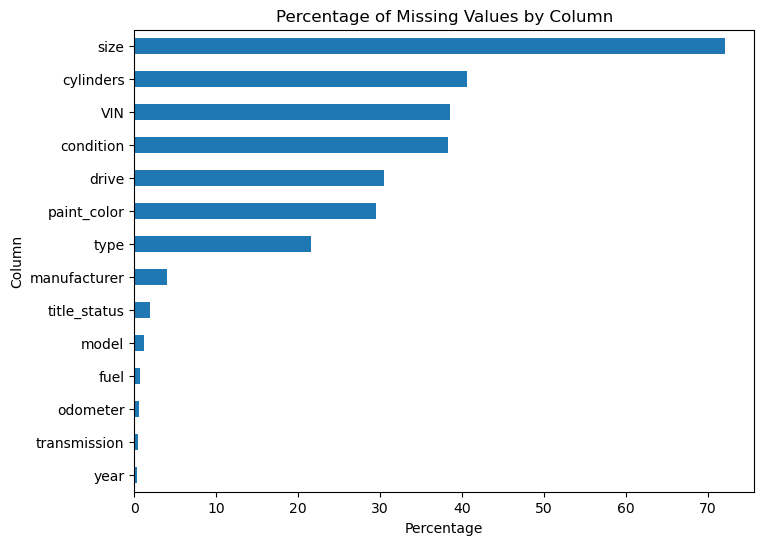

In [162]:
# Remove bad data w.r.t. price
df = df[df['price'] > 0]

price_low = df['price'].quantile(0.01)
price_high = df['price'].quantile(0.9999)
df = df[df['price'] >= price_low]
df = df[df['price'] <= price_high]

print_df_info(df)

In [163]:
# convert cylinders to numerical values

df['cylinders'].replace('other', np.NaN, inplace=True)
df['cylinders'] = df.apply(lambda row: int(row['cylinders'].split(' ')[0]) if not pd.isnull(row['cylinders']) else row['cylinders'],
    axis=1
)
df['cylinders'].unique()

array([nan,  8.,  6.,  4.,  5.,  3., 10., 12.])

total rows=390026
          column    dtype  num_null  num_unique  \
0             id    int64         0      390026   
1         region   object         0         404   
2          price    int64         0       15496   
3           year  float64      1173         113   
4   manufacturer   object     15109          43   
5          model   object      4577       28020   
6      condition   object    149272           7   
7      cylinders  float64     38894           8   
8           fuel   object      2594           6   
9       odometer  float64      2276       98392   
10  title_status   object      7646           7   
11  transmission   object      1821           4   
12           VIN   object    150373      105243   
13         drive   object     23979           4   
14          size   object     85860           5   
15          type   object     11416          14   
16   paint_color   object    115294          13   
17         state   object         0          51   

            

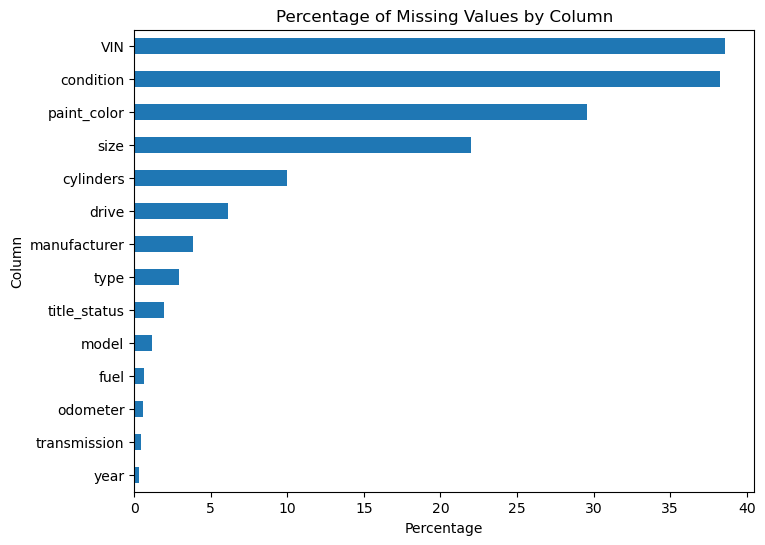

In [164]:
# function that imputes a column "col" by the max occuring value of "col" per value of the "model"
# we then imput 'drive', 'size', 'type', 'cylinders' and 'manufacturer' based on 'model'

def fill_na_by_model(df, col):
    temp_dict = df[['model',col,'id']].dropna(subset=['model',col]).groupby(['model',col]).count().sort_values(by=['model','id'], ascending=False)['id'].to_dict()
    # print(temp_dict)  
    model_col_map = dict()
    for (model, column), val in temp_dict.items():
        if model in model_col_map.keys():
            model_col_map[model][column] = val
        else:
            model_col_map[model] = {column: val}

    def fill_col(row):
        model_val = row['model']
        col_val = row[col]
        # print('filling {}, {}'.format(model_val, col_val))
        if pd.isnull(col_val) and not pd.isnull(model_val) and model_val in model_col_map.keys():
            col_map = model_col_map[model_val]
            return max(col_map, key= lambda x: col_map[x])
        else:
            return row[col]
    # df[col] = np.where(np.isnan(df[col]) and not np.isnan(df['model']) and df['model'] in model_col_map.keys(), max(model_col_map[df['model']], key= lambda x: model_col_map[df['model']][x]), df[col])
    df[col] = df.apply(
        lambda row: fill_col(row),
        axis=1
    )
    # print(model_col_map)
    # print(df.dropna(subset=['model',col]).groupby(['model',col]).count().to_dict(orient='dict')['id'])

fill_na_by_model(df, 'drive')
fill_na_by_model(df, 'size')
fill_na_by_model(df, 'type')
fill_na_by_model(df, 'cylinders')
fill_na_by_model(df, 'manufacturer')
print_df_info(df)

total rows=390026
          column    dtype  num_null  num_unique  \
0         region   object         0         404   
1          price    int64         0       15496   
2           year  float64      1173         113   
3   manufacturer   object     15109          43   
4          model   object      4577       28020   
5      condition   object    149272           7   
6      cylinders  float64     38894           8   
7           fuel   object      2594           6   
8       odometer  float64      2276       98392   
9   title_status   object      7646           7   
10  transmission   object      1821           4   
11         drive   object     23979           4   
12          size   object     85860           5   
13          type   object     11416          14   
14         state   object         0          51   

                                        unique_values  
0   [southwest MN, raleigh / durham / CH, yakima, ...  
1   [19650, 6400, 42977, 18493, 9996, 41608, 5335,...

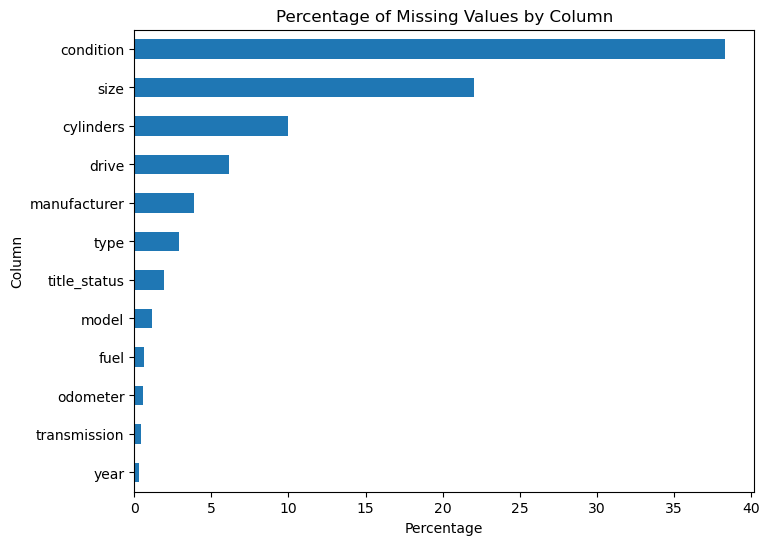

In [165]:
# dropping columns which aren't important
df.drop(columns=['id','VIN','paint_color'],inplace=True)
print_df_info(df)

total rows=358290
          column    dtype  num_null  num_unique  \
0         region   object         0         404   
1          price    int64         0       14541   
2           year  float64         0         107   
3   manufacturer   object         0          41   
4          model   object         0       20680   
5      condition   object    136273           7   
6      cylinders  float64     31140           8   
7           fuel   object         0           5   
8       odometer  float64         0       93482   
9   title_status   object         0           6   
10  transmission   object         0           3   
11         drive   object     16963           4   
12          size   object     70527           5   
13          type   object      5933          14   
14         state   object         0          51   

                                        unique_values  
0   [oregon coast, knoxville, columbia / jeff city...  
1   [23956, 31570, 10893, 20067, 35582, 8484, 3993...

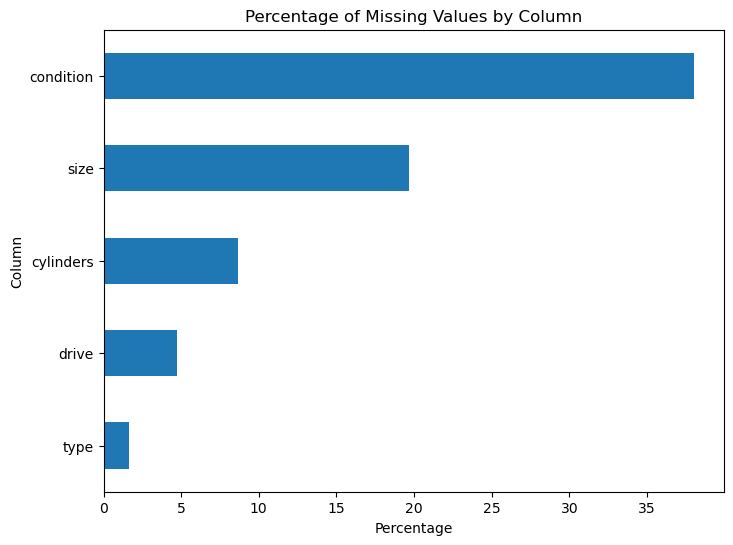

In [166]:
# remove rows having null values of columns having < 10% of null values
df.dropna(subset=['year','model','fuel','odometer','title_status','transmission','manufacturer'],inplace=True)
print_df_info(df)

#### Porportional imputation of the remaining columns

In [167]:
print (df['condition'].value_counts(normalize=True))
print (df['size'].value_counts(normalize=True))
print (df['cylinders'].value_counts(normalize=True))
print (df['drive'].value_counts(normalize=True))
print (df['type'].value_counts(normalize=True))

condition
good        0.51
excellent   0.37
like new    0.08
fair        0.03
new         0.00
salvage     0.00
Name: proportion, dtype: float64
size
full-size     0.50
mid-size      0.32
compact       0.16
sub-compact   0.02
Name: proportion, dtype: float64
cylinders
6.00    0.37
4.00    0.33
8.00    0.28
5.00    0.01
10.00   0.00
3.00    0.00
12.00   0.00
Name: proportion, dtype: float64
drive
4wd   0.45
fwd   0.36
rwd   0.19
Name: proportion, dtype: float64
type
sedan         0.27
SUV           0.24
pickup        0.13
truck         0.11
coupe         0.06
other         0.05
hatchback     0.05
wagon         0.03
van           0.03
convertible   0.02
mini-van      0.02
offroad       0.00
bus           0.00
Name: proportion, dtype: float64


In [170]:
df['condition'] = df['condition'].fillna(pd.Series(np.random.choice(['good', 'excellent', 'like new', 'fair'], 
                                                      p=[0.49, 0.39, 0.09, 0.03], size=orig_num_rows)))
df['size'] = df['size'].fillna(pd.Series(np.random.choice(['full-size', 'mid-size', 'compact', 'sub-compact'], 
                                                      p=[0.51, 0.31, 0.16, 0.02], size=orig_num_rows)))
df['cylinders'] = df['cylinders'].fillna(pd.Series(np.random.choice([6.0, 4.0, 8.0, 5.0], 
                                                      p=[0.37, 0.34, 0.28, 0.01], size=orig_num_rows)))
df['drive'] = df['drive'].fillna(pd.Series(np.random.choice(['4wd', 'fwd', 'rwd'], 
                                                      p=[0.45, 0.36, 0.19], size=orig_num_rows)))
df['type'] = df['type'].fillna(pd.Series(np.random.choice(['sedan', 'SUV', 'pickup', 'truck', 'coupe', 'other', 'hatchback', 'wagon', 'van', 'convertible', 'mini-van'], 
                                                      p=[0.27, 0.24, 0.13, 0.11, 0.05, 0.05, 0.05, 0.03, 0.03, 0.02, 0.02], size=orig_num_rows)))

print_df_info(df)

total rows=358290
          column    dtype  num_null  num_unique  \
0         region   object         0         404   
1          price    int64         0       14541   
2           year  float64         0         107   
3   manufacturer   object         0          41   
4          model   object         0       20680   
5      condition   object         0           6   
6      cylinders  float64         0           7   
7           fuel   object         0           5   
8       odometer  float64         0       93482   
9   title_status   object         0           6   
10  transmission   object         0           3   
11         drive   object         0           3   
12          size   object         0           4   
13          type   object         0          13   
14         state   object         0          51   

                                        unique_values  
0   [laredo, northwest OK, anchorage / mat-su, leh...  
1   [1195, 43990, 70950, 18744, 10841, 7577, 26924...

total rows=315853
          column    dtype  num_null  num_unique  \
0         region   object         0         404   
1          price    int64         0       13913   
2           year  float64         0         105   
3   manufacturer   object         0          41   
4          model   object         0        9986   
5      condition   object         0           7   
6      cylinders  float64         0           7   
7           fuel   object         0           5   
8       odometer  float64         0       91579   
9   title_status   object         0           6   
10  transmission   object         0           3   
11         drive   object         0           3   
12          size   object         0           4   
13          type   object         0          13   
14         state   object         0          51   

                                        unique_values  
0   [chattanooga, roseburg, southern WV, dothan, a...  
1   [12573, 6909, 6221, 42, 6687, 3925, 18944, 139...

IndexError: index 0 is out of bounds for axis 0 with size 0

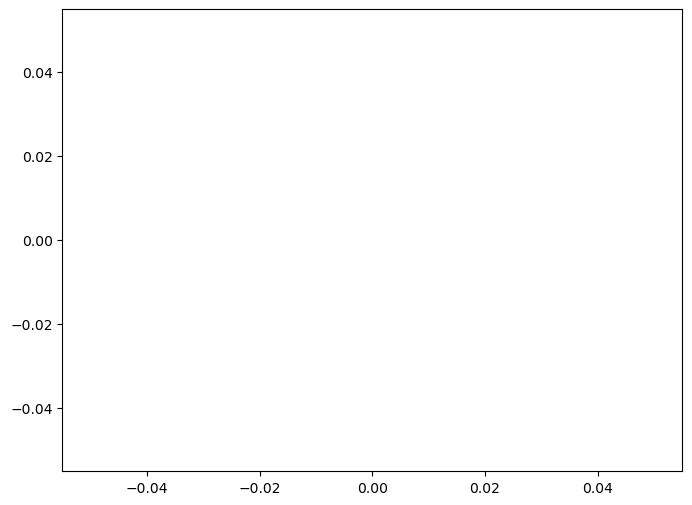

In [25]:
# dataset 1 created by dropping all remaining null rows
# df1 = df.dropna(subset=['cylinders','drive','size','type'])
# print_df_info(df1)

In [ ]:
# transform df1
transformer1 = ColumnTransformer(
    transformers=[
        ('num', StandardScaler(),make_column_selector(dtype_include=np.number)),
        ('cat',OneHotEncoder(),make_column_selector(dtype_include=object))
    ]
)
# transformer1.set_output(transform="pandas")
transformer1

In [ ]:
X1 = df1.drop('price', axis=1)
y1 = df1['price']
transformer1.fit_transform(X1)

In [ ]:
# dataset 2 created by imputing columns having null values
transformer1 = ColumnTransformer(
    transformers=[
        ('numerical', StandardScaler(),make_column_selector(dtype_include=np.number)),
        ('categorical',OneHotEncoder(sparse_output=False, handle_unknown="ignore"),['drive'])
    ],
    remainder='passthrough'
)
transformer1.set_output(transform="pandas")
transformer1

In [ ]:
X = df.drop('price', axis=1)
y = df['price']
Xt = transformer1.fit_transform(X)

In [ ]:
Xt.head()

### Modeling

With your (almost?) final dataset in hand, it is now time to build some models.  Here, you should build a number of different regression models with the price as the target.  In building your models, you should explore different parameters and be sure to cross-validate your findings.

### Evaluation

With some modeling accomplished, we aim to reflect on what we identify as a high quality model and what we are able to learn from this.  We should review our business objective and explore how well we can provide meaningful insight on drivers of used car prices.  Your goal now is to distill your findings and determine whether the earlier phases need revisitation and adjustment or if you have information of value to bring back to your client.

### Deployment

Now that we've settled on our models and findings, it is time to deliver the information to the client.  You should organize your work as a basic report that details your primary findings.  Keep in mind that your audience is a group of used car dealers interested in fine tuning their inventory.